In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.metrics import roc_curve, auc
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')

### IMPORTING DATA

In [3]:
# To import data
df = pd.read_csv("healthcare-dataset-stroke-data.csv")

### DATA CLEANING AND PREPROCESSING

In [4]:
#To display the first few rows of the data
df.head().style

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.000000,0,1,Yes,Private,Urban,228.690000,36.600000,formerly smoked,1
1,51676,Female,61.000000,0,0,Yes,Self-employed,Rural,202.210000,nan,never smoked,1
2,31112,Male,80.000000,0,1,Yes,Private,Rural,105.920000,32.500000,never smoked,1
3,60182,Female,49.000000,0,0,Yes,Private,Urban,171.230000,34.400000,smokes,1
4,1665,Female,79.000000,1,0,Yes,Self-employed,Rural,174.120000,24.000000,never smoked,1


In [5]:
# To get the dimension of the data
df.shape

(5110, 12)

In [6]:
#To display the summary of the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


In [7]:
#Fill missing values in 'bmi' with the mean value of the column
df['bmi'].fillna(df['bmi'].mean(), inplace=True)

In [8]:
# To verify if missing values have been addressed
missing_values_after_imputation = df.isnull().sum()
missing_values_after_imputation

id                   0
gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

In [9]:
# To check for duplicate rows
duplicates = df.duplicated().sum()
duplicates 

0

### DROPPING COLUMN

In [10]:
# To drop the 'id' column 
df.drop('id', axis=1, inplace=True)

In [11]:
# To check the occurrence of each unique value for the target variable stroke
df["stroke"].value_counts()

stroke
0    4861
1     249
Name: count, dtype: int64

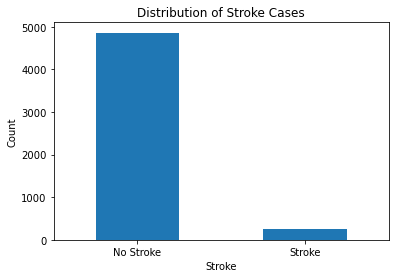

In [12]:
# To Create a bar chart for the stroke variable
stroke_counts = df['stroke'].value_counts()
stroke_counts.plot(kind='bar')
plt.title('Distribution of Stroke Cases')
plt.xlabel('Stroke')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=['No Stroke', 'Stroke'], rotation=0) 
plt.show()

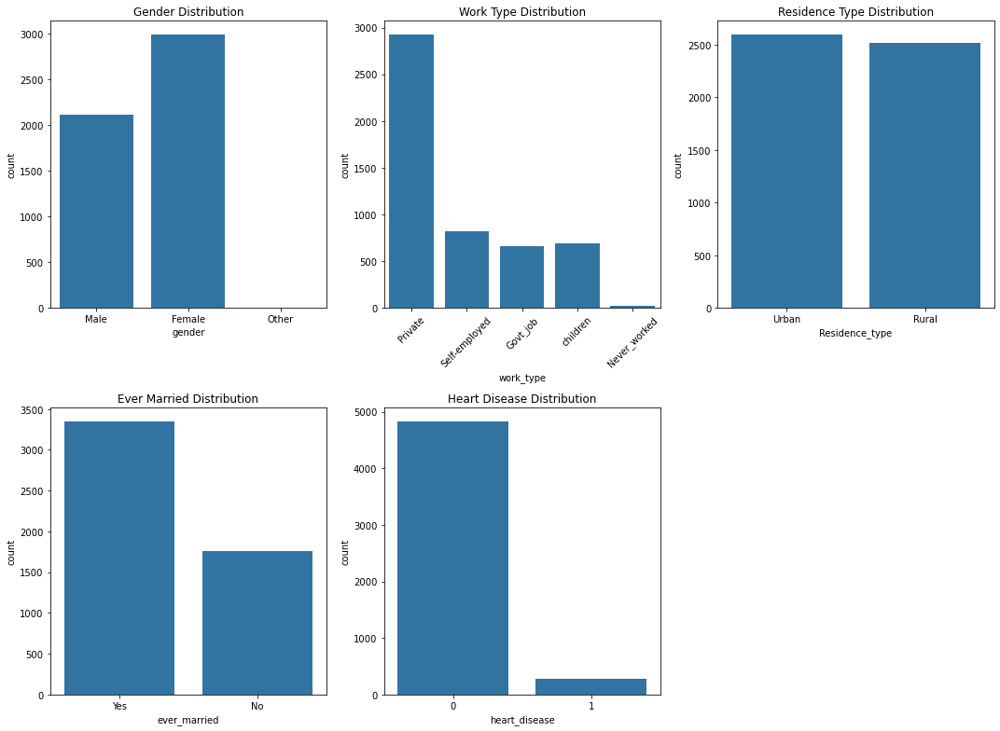

In [13]:
# Creating a larger figure for categorical variable distributions
fig, ax = plt.subplots(2, 3, figsize=(15, 11))  # Adjust subplot to 2 rows and 3 columns

# Gender Distribution
sns.countplot(x='gender', data=df, ax=ax[0, 0])
ax[0, 0].set_title('Gender Distribution')

# Work Type Distribution
sns.countplot(x='work_type', data=df, ax=ax[0, 1])
ax[0, 1].set_title('Work Type Distribution')
ax[0, 1].tick_params(axis='x', rotation=45)

# Residence Type Distribution
sns.countplot(x='Residence_type', data=df, ax=ax[0, 2])
ax[0, 2].set_title('Residence Type Distribution')

# Ever Married Distribution
sns.countplot(x='ever_married', data=df, ax=ax[1, 0])
ax[1, 0].set_title('Ever Married Distribution')

# Heart Disease Distribution
sns.countplot(x='heart_disease', data=df, ax=ax[1, 1])
ax[1, 1].set_title('Heart Disease Distribution')

fig.delaxes(ax[1, 2])

plt.tight_layout()
plt.show()

### FEATURE ENCODING FOR CATEGORICAL VARIABLES

In [14]:
from sklearn.preprocessing import LabelEncoder

# Create a new DataFrame to hold the encoded data
df_encoded = df.copy()

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# List of categorical columns to be label encoded
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

# Apply Label Encoding to each categorical column
for col in categorical_cols:
    df_encoded[col] = label_encoder.fit_transform(df_encoded[col])

df_encoded.head()


,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1,67.0,0,1,1,2,1,228.69,36.600000,1,1
1,0,61.0,0,0,1,3,0,202.21,28.893237,2,1
2,1,80.0,0,1,1,2,0,105.92,32.500000,2,1
3,0,49.0,0,0,1,2,1,171.23,34.400000,3,1
4,0,79.0,1,0,1,3,0,174.12,24.000000,2,1


### FEATURE SCALING FOR NUMERICAL VARIABLE

In [15]:
from sklearn.preprocessing import StandardScaler

# To initialize the StandardScaler
scaler = StandardScaler()

# List of columns to scale
columns_to_scale = ['age', 'avg_glucose_level', 'bmi']

# Perform standardization on the dataset
df_encoded[columns_to_scale] = scaler.fit_transform(df_encoded[columns_to_scale])

# To display the first few rows to confirm the scaling
df_encoded.head()


,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1,1.051434,0,1,1,2,1,2.706375,1.001234e+00,1,1
1,0,0.786070,0,0,1,3,0,2.121559,4.615554e-16,2,1
2,1,1.626390,0,1,1,2,0,-0.005028,4.685773e-01,2,1
3,0,0.255342,0,0,1,2,1,1.437358,7.154182e-01,3,1
4,0,1.582163,1,0,1,3,0,1.501184,-6.357112e-01,2,1


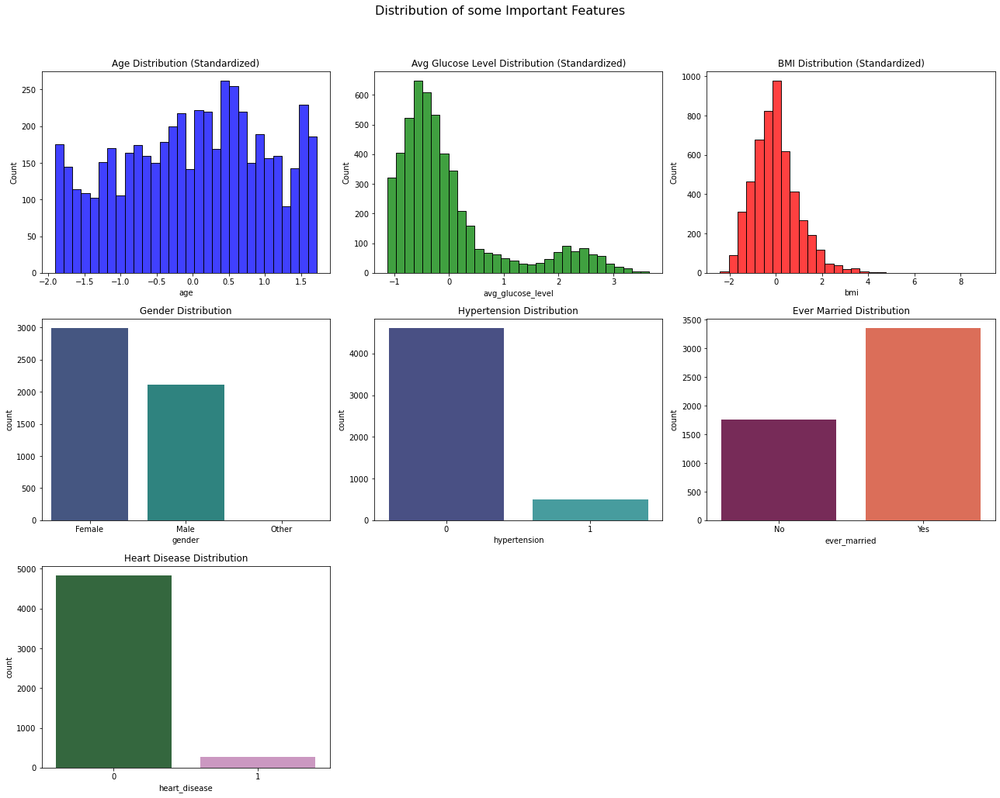

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Adjusting and replotting the visualizations for the scaled data without KDE to avoid errors
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
fig.suptitle('Distribution of some Important Features', fontsize=16)

# Histograms for scaled continuous features without KDE
sns.histplot(df_encoded['age'], bins=30, ax=axes[0, 0], color='blue')
axes[0, 0].set_title('Age Distribution (Standardized)')
sns.histplot(df_encoded['avg_glucose_level'], bins=30, ax=axes[0, 1], color='green')
axes[0, 1].set_title('Avg Glucose Level Distribution (Standardized)')
sns.histplot(df_encoded['bmi'], bins=30, ax=axes[0, 2], color='red')
axes[0, 2].set_title('BMI Distribution (Standardized)')

# Bar charts for categorical features (same as before since not scaled)
sns.countplot(x=df_encoded['gender'], ax=axes[1, 0], palette='viridis')
axes[1, 0].set_title('Gender Distribution')
axes[1, 0].set_xticklabels(['Female', 'Male', 'Other'])  # Labels adjusted previously
sns.countplot(x=df_encoded['hypertension'], ax=axes[1, 1], palette='mako')
axes[1, 1].set_title('Hypertension Distribution')
sns.countplot(x=df_encoded['ever_married'], ax=axes[1, 2], palette='rocket')
axes[1, 2].set_title('Ever Married Distribution')
axes[1, 2].set_xticklabels(['No', 'Yes'])  # Adjusting labels

# Bar chart for heart disease
sns.countplot(x=df_encoded['heart_disease'], ax=axes[2, 0], palette='cubehelix')
axes[2, 0].set_title('Heart Disease Distribution')

# Removing empty plots
for i in range(1, 3):
    axes[2, i].set_visible(False)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


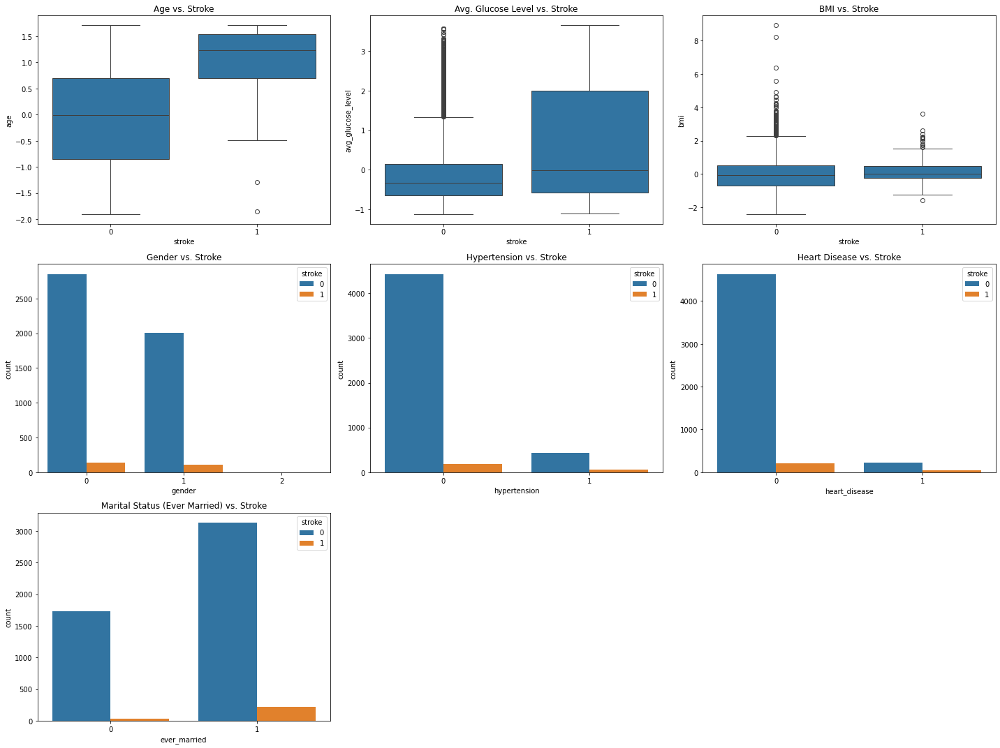

In [17]:
# visuals of some important features against the target variable stroke
# Creating a figure to hold the enhanced visualizations
fig, axes = plt.subplots(3, 3, figsize=(20, 15))

# Box plots for continuous features against 'stroke'
sns.boxplot(data=df_encoded, x='stroke', y='age', ax=axes[0, 0])
axes[0, 0].set_title('Age vs. Stroke')
sns.boxplot(data=df_encoded, x='stroke', y='avg_glucose_level', ax=axes[0, 1])
axes[0, 1].set_title('Avg. Glucose Level vs. Stroke')
sns.boxplot(data=df_encoded, x='stroke', y='bmi', ax=axes[0, 2])
axes[0, 2].set_title('BMI vs. Stroke')

# Count plots for binary/categorical features against 'stroke'
sns.countplot(data=df_encoded, x='gender', hue='stroke', ax=axes[1, 0])
axes[1, 0].set_title('Gender vs. Stroke')
sns.countplot(data=df_encoded, x='hypertension', hue='stroke', ax=axes[1, 1])
axes[1, 1].set_title('Hypertension vs. Stroke')
sns.countplot(data=df_encoded, x='heart_disease', hue='stroke', ax=axes[1, 2])
axes[1, 2].set_title('Heart Disease vs. Stroke')

# Count plot for 'ever_married' against 'stroke'
sns.countplot(data=df_encoded, x='ever_married', hue='stroke', ax=axes[2, 0])
axes[2, 0].set_title('Marital Status (Ever Married) vs. Stroke')

# Removing empty plots
fig.delaxes(axes[2][1])
fig.delaxes(axes[2][2])

plt.tight_layout()
plt.show()


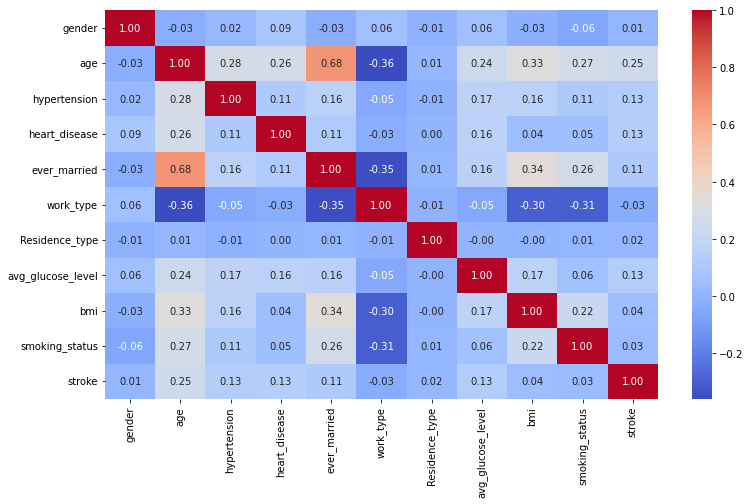

In [18]:
# Generate a correlation matrix
correlation_matrix = df_encoded.corr()

# Set up the matplotlib figure
plt.figure(figsize=(16, 9))

# Draw the heatmap
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')

# Adjust layout to make room for the colorbar
plt.subplots_adjust(left=0.2, right=0.8, top=0.8, bottom=0.2)

# Show the plot
plt.show()

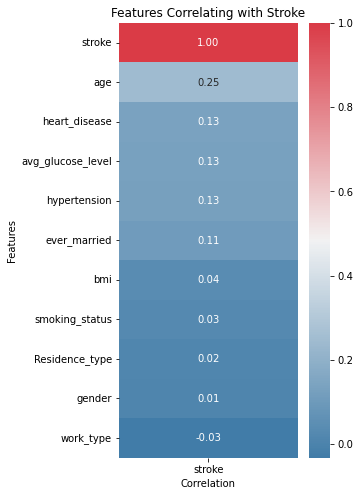

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix
correlation_matrix = df_encoded.corr()

# Isolate the 'stroke' correlation values, assuming 'stroke' is the name of your target column
stroke_correlation = correlation_matrix[['stroke']].sort_values(by='stroke', ascending=False)

# Set up the matplotlib figure
plt.figure(figsize=(4, 8))

# Generate a color palette
cmap = sns.diverging_palette(240, 10, as_cmap=True)

# Draw the heatmap
sns.heatmap(stroke_correlation, annot=True, fmt=".2f", cmap=cmap, cbar=True)

# Add title and labels as needed
plt.title('Features Correlating with Stroke')
plt.xlabel('Correlation')
plt.ylabel('Features')
plt.show()


### DEALING WITH OUTLIER

In [20]:
# To Cap outliers for 'avg_glucose_level' and 'bmi' at the 95th percentile
for col in ['avg_glucose_level', 'bmi']:
    percentile_95 = df_encoded[col].quantile(0.95)
    df_encoded[col] = df_encoded[col].clip(upper=percentile_95)

 ### SMOTE FOR CLASS IMBALANCE

In [21]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# To separate the features and the target variable
X = df_encoded.drop('stroke', axis=1)
Y = df_encoded['stroke']

# Applying SMOTE to the dataset before splitting
smote = SMOTE(random_state=42)
X_smote, Y_smote = smote.fit_resample(X, Y)

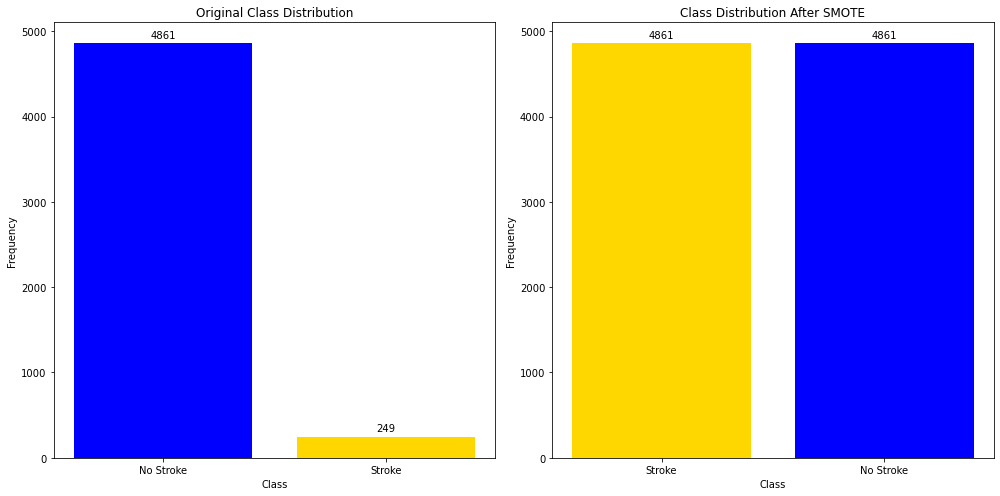

In [22]:
# To visualize the stroke distribution before and after smote

# Original class distribution
original_dist = Y.value_counts()

# Class distribution after SMOTE
smote_dist = Y_smote.value_counts()

def add_labels(ax, bars):
    """Add labels to the bars on the bar chart."""
    for bar in bars:
        height = bar.get_height()
        ax.annotate('{}'.format(height),
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

# Create the figure and axes objects
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Original distribution
bars1 = axes[0].bar(original_dist.index, original_dist.values, color=['blue', 'gold'])
axes[0].set_title('Original Class Distribution')
axes[0].set_xlabel('Class')
axes[0].set_ylabel('Frequency')
axes[0].set_xticks(original_dist.index)
axes[0].set_xticklabels(['No Stroke', 'Stroke'])
add_labels(axes[0], bars1)

# Distribution after SMOTE
bars2 = axes[1].bar(smote_dist.index, smote_dist.values, color=['blue', 'gold'])
axes[1].set_title('Class Distribution After SMOTE')
axes[1].set_xlabel('Class')
axes[1].set_ylabel('Frequency')
axes[1].set_xticks(smote_dist.index)
axes[1].set_xticklabels(['No Stroke', 'Stroke'])
add_labels(axes[1], bars2)

plt.tight_layout()
plt.show()

### SPLITTING THE DATA

In [23]:
# To Split the dataset into training (80%) and testing (20%)
X_train, X_test, Y_train, Y_test = train_test_split(X_smote, Y_smote, test_size=0.2, random_state=42)

In [24]:
# Check the class distribution in the training set before applying SMOTE
class_distribution_before_smote = Y_smote.value_counts()

print(class_distribution_before_smote)


stroke
1    4861
0    4861
Name: count, dtype: int64


### LOGISTIC REGRESSION

In [25]:
# To Initialize the logisic regression model
logistic_model = LogisticRegression(C= 0.01, penalty= 'l2', solver= 'liblinear', random_state=42, max_iter=200)


# To perform cross-validation
cv_scores = cross_val_score(logistic_model, X_train, Y_train, cv=5)

# To print the cross-validation scores and the mean score
print(f"Cross-validation scores: {cv_scores}")
print(f"Mean CV score: {cv_scores.mean()}")

Cross-validation scores: [0.80205656 0.77892031 0.78006431 0.78135048 0.79485531]
Mean CV score: 0.7874493920432473


In [27]:
from sklearn.model_selection import GridSearchCV

# Define parameter grid
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'solver': ['liblinear', 'saga']  # 'liblinear' works well with 'l1'
}

# Create GridSearchCV object
grid_search = GridSearchCV(logistic_model, param_grid, cv=5, scoring='accuracy', verbose=1)

# Fit GridSearchCV
grid_search.fit(X_train, Y_train)
print("Best parameters:", grid_search.best_params_)


Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best parameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'liblinear'}


### TRAINING THE MODEL

In [26]:
# To train the logistic regression model
logistic_model.fit(X_smote, Y_smote)

# To make prediction on the test set
Y_pred_logistic = logistic_model.predict(X_test)

# To print the Evaluation metrics
print(f'Accuracy: {accuracy_score(Y_test, Y_pred_logistic)}')
print(f'Precision: {precision_score(Y_test, Y_pred_logistic)}')
print(f'Recall: {recall_score(Y_test, Y_pred_logistic)}')
print(f'F1 Score: {f1_score(Y_test, Y_pred_logistic)}')

Accuracy: 0.7840616966580977
Precision: 0.7579737335834896
Recall: 0.8329896907216495
F1 Score: 0.793713163064833


### COMMUNICATING THE RESULT

In [72]:
from sklearn.metrics import classification_report

report = classification_report(Y_test, Y_pred_logistic, target_names=['No Stroke', 'Stroke'])

# Adding some decorative elements
decorator = "=" * 50
title = "Classification Report for Logistic Regression"

# Print the styled output
print(decorator)
print(title.center(50))
print(decorator)
print(report)
print(decorator)


  Classification Report for Logistic Regression   
              precision    recall  f1-score   support

   No Stroke       0.82      0.74      0.77       975
      Stroke       0.76      0.83      0.79       970

    accuracy                           0.78      1945
   macro avg       0.79      0.78      0.78      1945
weighted avg       0.79      0.78      0.78      1945



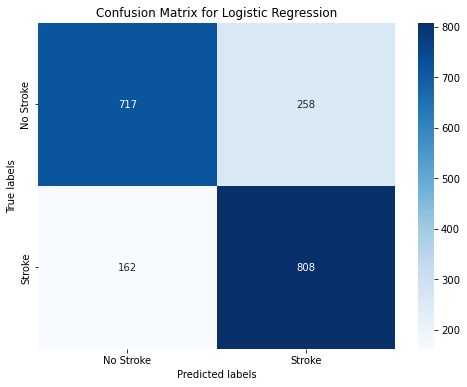

In [73]:
# To plot the confusion matrix
c_matrix = confusion_matrix(Y_test, Y_pred_logistic)

plt.figure(figsize=(8, 6))
sns.heatmap(c_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['No Stroke', 'Stroke'], yticklabels=['No Stroke', 'Stroke'])
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

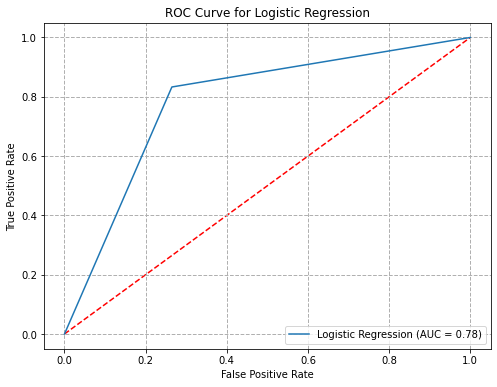

In [74]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming Y_test and Y_pred_logistic are available and contain the true labels and predicted probabilities

# Calculate the ROC curve and AUC
fpr, tpr, thresholds = roc_curve(Y_test, Y_pred_logistic)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
# The 'zorder' parameter places the grid below the ROC curve
plt.plot(fpr, tpr, label=f'Logistic Regression (AUC = {roc_auc:.2f})', zorder=2)
plt.plot([0, 1], [0, 1], 'r--', zorder=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Logistic Regression')
plt.legend(loc="lower right")
# Enable grid with 'zorder' set to 0 to place it behind the ROC curve
plt.grid(True, which='both', linestyle='--', linewidth=1, zorder=0.5)
plt.show()


In [71]:
from lime import lime_tabular
import warnings
warnings.filterwarnings("ignore")


# Initialize the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_smote),
    feature_names=X_smote.columns,
    class_names=['No Stroke', 'Stroke'],
    mode='classification'
)

# Choose an instance to explain
instance_to_explain = X_test.iloc[0].astype(float)

# Explain the prediction made by the logistic regression model
explanation = explainer.explain_instance(
    data_row=instance_to_explain,
    predict_fn=logistic_model.predict_proba
)

print("Logistic Regression Model Explanation")

explanation.show_in_notebook(show_table=True)


Logistic Regression Model Explanation


## DECISION TREE 

In [34]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

In [35]:
# Initialize the Decision Tree Classifier
decision_tree = DecisionTreeClassifier(criterion= 'entropy', min_samples_leaf=1, min_samples_split= 2, random_state=42)

# To perform cross validation
cv_scores = cross_val_score(decision_tree, X_train, Y_train, cv=5)

# To print the cross-validation scores
print(f"Cross-validation scores: {cv_scores}")
print(f"Mean cross-validation score: {cv_scores.mean()}")

Cross-validation scores: [0.90424165 0.92673522 0.8977492  0.90675241 0.92154341]
Mean cross-validation score: 0.9114043759660767


### TRAIN THE MODEL

In [36]:
# To train the model
decision_tree.fit(X_train, Y_train)

# Predict on the testing data
Y_pred_decision_tree = decision_tree.predict(X_test)

# To evaluate the Model
print("Accuracy:", accuracy_score(Y_test, Y_pred_decision_tree))
print("Precision:", precision_score(Y_test, Y_pred_decision_tree))
print("Recall:", recall_score(Y_test, Y_pred_decision_tree))
print("F1 Score:", f1_score(Y_test, Y_pred_decision_tree))

Accuracy: 0.9156812339331619
Precision: 0.9103869653767821
Recall: 0.9216494845360824
F1 Score: 0.915983606557377


### COMMUNICATING THE RESULT

In [37]:
from sklearn.metrics import classification_report

report = classification_report(Y_test, Y_pred_decision_tree, target_names=['No Stroke', 'Stroke'])

# Adding some decorative elements
decorator = "=" * 50
title = "Classification Report for Decision Tree"

# Print the styled output
print(decorator)
print(title.center(50))
print(decorator)
print(report)
print(decorator)


     Classification Report for Decision Tree      
              precision    recall  f1-score   support

   No Stroke       0.92      0.91      0.92       975
      Stroke       0.91      0.92      0.92       970

    accuracy                           0.92      1945
   macro avg       0.92      0.92      0.92      1945
weighted avg       0.92      0.92      0.92      1945



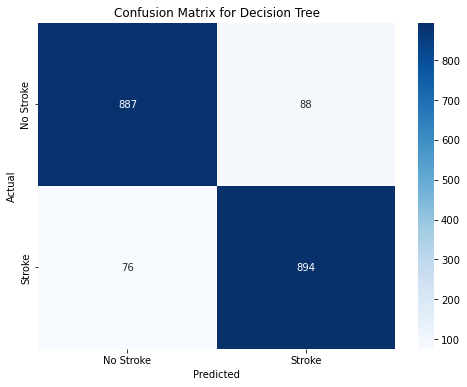

In [38]:
# To generate the confusion matrix
DT = confusion_matrix(Y_test, Y_pred_decision_tree)

# To visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(DT, annot=True, fmt="d", cmap="Blues", xticklabels=['No Stroke', 'Stroke'], yticklabels=['No Stroke', 'Stroke'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Decision Tree')
plt.show()

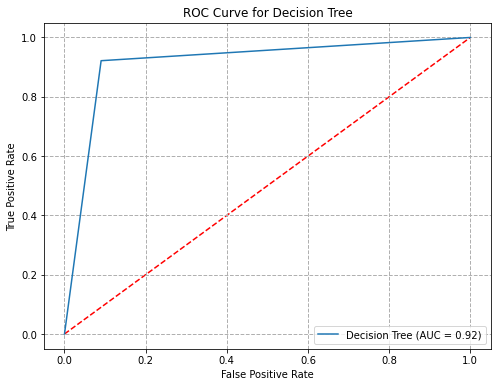

In [39]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming Y_test and Y_pred_logistic are available and contain the true labels and predicted probabilities

# Calculate the ROC curve and AUC
fpr, tpr, thresholds = roc_curve(Y_test, Y_pred_decision_tree)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
# The 'zorder' parameter places the grid below the ROC curve
plt.plot(fpr, tpr, label=f'Decision Tree (AUC = {roc_auc:.2f})', zorder=2)
plt.plot([0, 1], [0, 1], 'r--', zorder=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Decision Tree')
plt.legend(loc="lower right")
# Enable grid with 'zorder' set to 0 to place it behind the ROC curve
plt.grid(True, which='both', linestyle='--', linewidth=1, zorder=0.5)
plt.show()


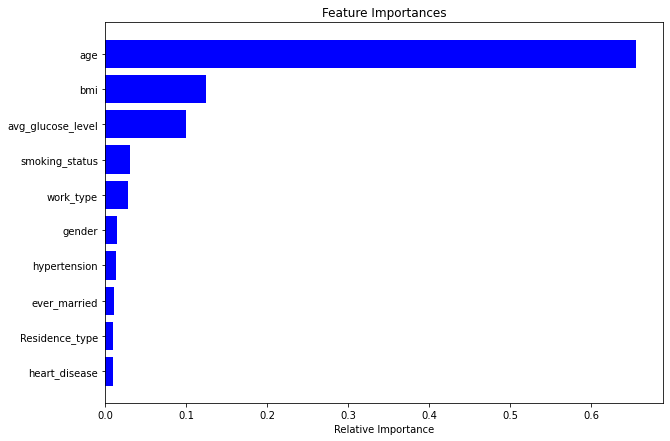

In [40]:
# To perform the feature importance
feature_importance = decision_tree.feature_importances_
features = X_train.columns
indices = np.argsort(feature_importance)

plt.figure(figsize=(10, 7))
plt.title('Feature Importances')
plt.barh(range(len(indices)), feature_importance[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [70]:
# Initialize the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_smote),
    feature_names=X_smote.columns,
    class_names=['No Stroke', 'Stroke'],
    mode='classification'
)

# Choose an instance to explain
instance_to_explain = X_test.iloc[0].astype(float)

# Explain the prediction made by the Decision Tree
explanation = explainer.explain_instance(
    data_row=instance_to_explain,
    predict_fn=decision_tree.predict_proba
)

print("Decision Tree Model Explanation")
# Show the explanation
explanation.show_in_notebook(show_table=True)


Decision Tree Model Explanation


### K-NEAREST NEIGHBOR

In [42]:
from sklearn.neighbors import KNeighborsClassifier

In [43]:
# To initialise the KNN Classifier 
knn = KNeighborsClassifier(n_neighbors=3, p=2, weights= 'distance')

# To perform cross-validation
cv_scores = cross_val_score(knn, X_train, Y_train, cv=5)

# To print the cross-validation scores and the mean score
print(f"Cross-validation scores: {cv_scores}")
print(f"Mean CV score: {cv_scores.mean()}")

Cross-validation scores: [0.89974293 0.88946015 0.88681672 0.88167203 0.90353698]
Mean CV score: 0.8922457616611148


In [44]:
# To train the model
knn.fit(X_train, Y_train)

# Make predictions
Y_pred_knn = knn.predict(X_test)

# To evaluate the Model
print("Accuracy:", accuracy_score(Y_test, Y_pred_knn))
print("Precision:", precision_score(Y_test, Y_pred_knn))
print("Recall:", recall_score(Y_test, Y_pred_knn))
print("F1 Score:", f1_score(Y_test, Y_pred_knn))


Accuracy: 0.9012853470437018
Precision: 0.8436395759717314
Recall: 0.9845360824742269
F1 Score: 0.9086584205518554


### COMMUNICATING THE RESULT

In [45]:
report = classification_report(Y_test, Y_pred_knn, target_names=['No Stroke', 'Stroke'])

# Adding some decorative elements
decorator = "=" * 50
title = "Classification Report for K Nearest Neighbor"

# Print the styled output
print(decorator)
print(title.center(50))
print(decorator)
print(report)
print(decorator)


   Classification Report for K Nearest Neighbor   
              precision    recall  f1-score   support

   No Stroke       0.98      0.82      0.89       975
      Stroke       0.84      0.98      0.91       970

    accuracy                           0.90      1945
   macro avg       0.91      0.90      0.90      1945
weighted avg       0.91      0.90      0.90      1945



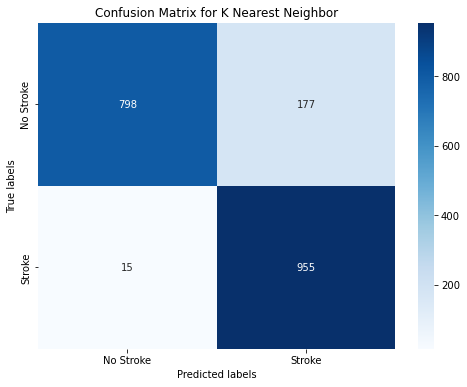

In [46]:
# To plot the confusion matrix
c_matrix = confusion_matrix(Y_test, Y_pred_knn)

plt.figure(figsize=(8, 6))
sns.heatmap(c_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['No Stroke', 'Stroke'], yticklabels=['No Stroke', 'Stroke'])
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for K Nearest Neighbor')
plt.show()

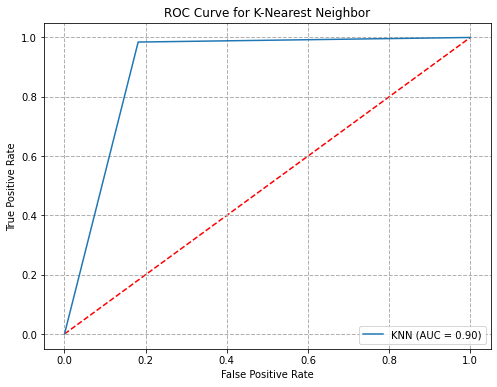

In [47]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming Y_test and Y_pred_logistic are available and contain the true labels and predicted probabilities

# Calculate the ROC curve and AUC
fpr, tpr, thresholds = roc_curve(Y_test, Y_pred_knn)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
# The 'zorder' parameter places the grid below the ROC curve
plt.plot(fpr, tpr, label=f'KNN (AUC = {roc_auc:.2f})', zorder=2)
plt.plot([0, 1], [0, 1], 'r--', zorder=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for K-Nearest Neighbor')
plt.legend(loc="lower right")
# Enable grid with 'zorder' set to 0 to place it behind the ROC curve
plt.grid(True, which='both', linestyle='--', linewidth=1, zorder=0.5)
plt.show()


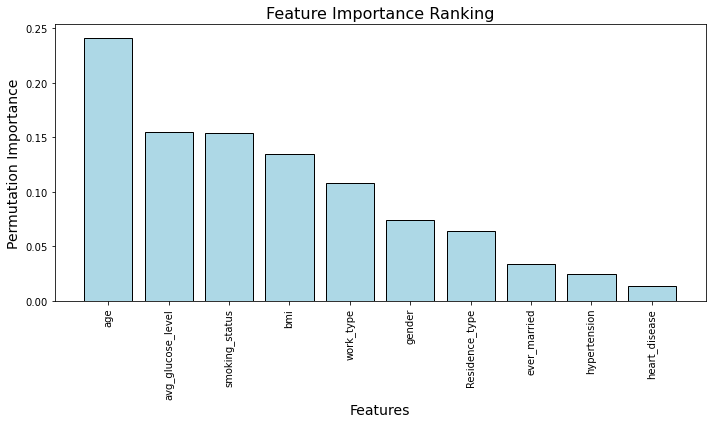

In [48]:
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np


# Perform permutation importance
results = permutation_importance(knn, X_test, Y_test, random_state=42)

# Get the importances and sort them
importances = results.importances_mean
indices = np.argsort(importances)[::-1]

# Prepare the plot
plt.figure(figsize=(10, 6))
plt.title('Feature Importance Ranking', fontsize=16)
plt.bar(range(X_test.shape[1]), importances[indices], align='center', color='lightblue', edgecolor='black')
plt.xticks(range(X_test.shape[1]), X_test.columns[indices], rotation=90)
plt.xlabel('Features', fontsize=14)
plt.ylabel('Permutation Importance', fontsize=14)
plt.tight_layout()

# Show the plot
plt.show()


In [49]:
# Initialize the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_smote),
    feature_names=X_smote.columns,
    class_names=['No Stroke', 'Stroke'],
    mode='classification'
)

# Choose an instance to explain
instance_to_explain = X_test.iloc[0].astype(float)

# Explain the prediction made by K-Nearest Neighbor
explanation = explainer.explain_instance(
    data_row=instance_to_explain,
    predict_fn=knn.predict_proba
)

print("K-Nearest Neighbor Model Explanation")

explanation.show_in_notebook(show_table=True)


K-Nearest Neighbor Model Explanation


### RANDOM FOREST CLASSIFIER

In [ ]:
# To initialize the model
random_forest= RandomForestClassifier(n_estimators=300, min_samples_leaf=1, min_samples_split= 2, max_depth= 20, random_state=42))

### TRAINING THE MODEL

In [52]:
# To train the Model
random_forest.fit(X_train, Y_train)

# To make Predictions
Y_pred = random_forest.predict(X_test)

# To evaluate the Model
print("Accuracy:", accuracy_score(Y_test, Y_pred))
print("Precision:", precision_score(Y_test, Y_pred))
print("Recall:", recall_score(Y_test, Y_pred))
print("F1 Score:", f1_score(Y_test, Y_pred))

Accuracy: 0.9383033419023136
Precision: 0.9110251450676983
Recall: 0.9711340206185567
F1 Score: 0.9401197604790419


### COMMUNICATING THE RESULT

In [53]:
report = classification_report(Y_test, Y_pred, target_names=['No Stroke', 'Stroke'])

# Adding some decorative elements
decorator = "=" * 50
title = "Classification Report for Randon Forest Classifier"

# Print the styled output
print(decorator)
print(title.center(50))
print(decorator)
print(report)
print(decorator)


Classification Report for Randon Forest Classifier
              precision    recall  f1-score   support

   No Stroke       0.97      0.91      0.94       975
      Stroke       0.91      0.97      0.94       970

    accuracy                           0.94      1945
   macro avg       0.94      0.94      0.94      1945
weighted avg       0.94      0.94      0.94      1945



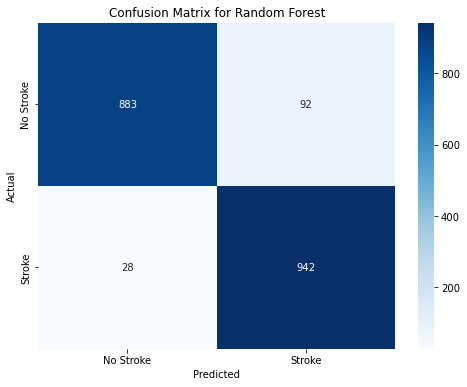

In [54]:
# To generate the confusion matrix
cm = confusion_matrix(Y_test, Y_pred)

# To visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['No Stroke', 'Stroke'], yticklabels=['No Stroke', 'Stroke'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest')
plt.show()

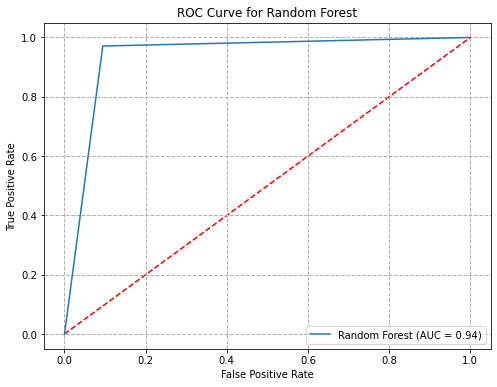

In [55]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming Y_test and Y_pred_logistic are available and contain the true labels and predicted probabilities

# Calculate the ROC curve and AUC
fpr, tpr, thresholds = roc_curve(Y_test, Y_pred)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
# The 'zorder' parameter places the grid below the ROC curve
plt.plot(fpr, tpr, label=f'Random Forest (AUC = {roc_auc:.2f})', zorder=2)
plt.plot([0, 1], [0, 1], 'r--', zorder=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Random Forest')
plt.legend(loc="lower right")
# Enable grid with 'zorder' set to 0 to place it behind the ROC curve
plt.grid(True, which='both', linestyle='--', linewidth=1, zorder=0.5)
plt.show()


### FEATURE IMPORTANCE

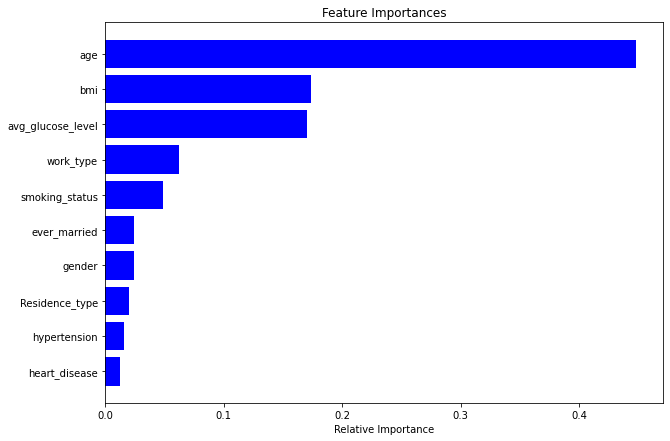

In [56]:
# To perform the feature importance
feature_importance = random_forest.feature_importances_
features = X_train.columns
indices = np.argsort(feature_importance)

plt.figure(figsize=(10, 7))
plt.title('Feature Importances')
plt.barh(range(len(indices)), feature_importance[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()


In [58]:
# Initialize the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_smote),
    feature_names=X_smote.columns,
    class_names=['No Stroke', 'Stroke'],
    mode='classification'
)

# Choose an instance to explain
instance_to_explain = X_test.iloc[0].astype(float)

# Explain the prediction made by the logistic regression model
explanation = explainer.explain_instance(
    data_row=instance_to_explain,
    predict_fn=random_forest.predict_proba
)

print("Random Forest Model Explanation")
# Show the explanation
explanation.show_in_notebook(show_table=True)


Random Forest Model Explanation


### GRADIENT BOOSTING 

In [59]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [60]:
# To initialize the Gradient boosting classifier
Gradient_boosting = GradientBoostingClassifier(n_estimators=200,learning_rate=0.1,max_depth=5,random_state=42)

# To perform cross-validation with 5 folds
cv_scores = cross_val_score(Gradient_boosting, X_train, Y_train, cv=5)

# To print the cross-validation scores and the mean score
print(f"Cross-validation scores: {cv_scores}")
print(f"Mean CV score: {cv_scores.mean()}")

Cross-validation scores: [0.94215938 0.94601542 0.94083601 0.94083601 0.94340836]
Mean CV score: 0.9426510386100068


### TRAINING THE MODEL

In [61]:
# To train the model
Gradient_boosting.fit(X_smote, Y_smote)

#To make prediction
Y_pred_Gradient_boosting = Gradient_boosting.predict(X_test)

# To evaluate the Model
print("Accuracy:", accuracy_score(Y_test, Y_pred_Gradient_boosting))
print("Precision:", precision_score(Y_test, Y_pred_Gradient_boosting))
print("Recall:", recall_score(Y_test, Y_pred_Gradient_boosting))
print("F1 Score:", f1_score(Y_test, Y_pred_Gradient_boosting))

Accuracy: 0.9820051413881749
Precision: 0.9874869655891554
Recall: 0.9762886597938144
F1 Score: 0.9818558838776568


### COMMUNICATING THE RESULT

In [62]:
report = classification_report(Y_test, Y_pred_Gradient_boosting, target_names=['No Stroke', 'Stroke'])

# Adding some decorative elements
decorator = "=" * 50
title = "Classification Report for Gradient Boosting"

# Print the styled output
print(decorator)
print(title.center(50))
print(decorator)
print(report)
print(decorator)


   Classification Report for Gradient Boosting    
              precision    recall  f1-score   support

   No Stroke       0.98      0.99      0.98       975
      Stroke       0.99      0.98      0.98       970

    accuracy                           0.98      1945
   macro avg       0.98      0.98      0.98      1945
weighted avg       0.98      0.98      0.98      1945



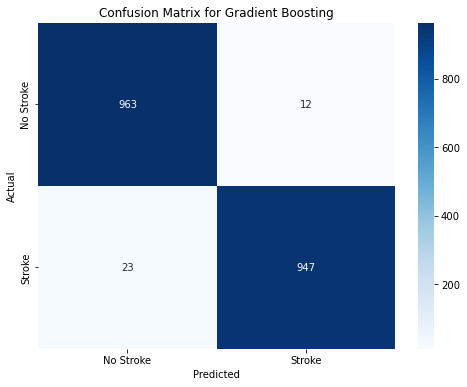

In [63]:
# To display the confusion matrix visual
cm = confusion_matrix(Y_test, Y_pred_Gradient_boosting)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Stroke', 'Stroke'], yticklabels=['No Stroke', 'Stroke'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Gradient Boosting')
plt.show()

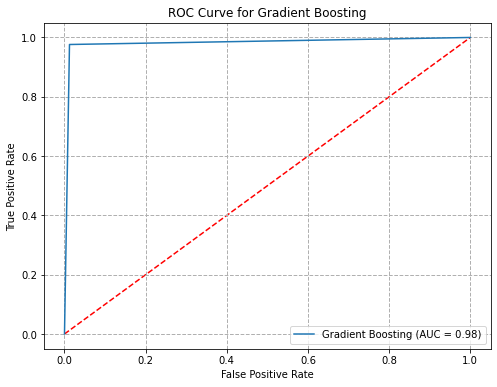

In [64]:
# Calculate the ROC curve and AUC
fpr, tpr, thresholds = roc_curve(Y_test, Y_pred_Gradient_boosting)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
# The 'zorder' parameter places the grid below the ROC curve
plt.plot(fpr, tpr, label=f'Gradient Boosting (AUC = {roc_auc:.2f})', zorder=2)
plt.plot([0, 1], [0, 1], 'r--', zorder=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Gradient Boosting')
plt.legend(loc="lower right")
# Enable grid with 'zorder' set to 0 to place it behind the ROC curve
plt.grid(True, which='both', linestyle='--', linewidth=1, zorder=0.5)
plt.show()


### FEATURE IMPORTANCE

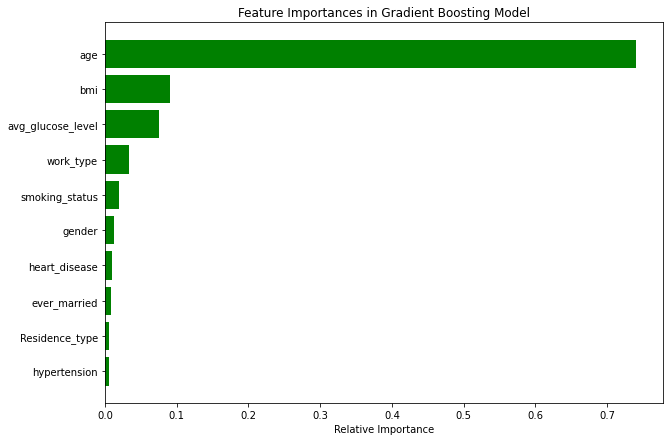

In [65]:
feature_importances_boosting = Gradient_boosting.feature_importances_
features = X_train.columns
indices = np.argsort(feature_importances_boosting)

plt.figure(figsize=(10, 7))
plt.title('Feature Importances in Gradient Boosting Model')
plt.barh(range(len(indices)), feature_importances_boosting[indices], color='g', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [66]:
# Initialize the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_smote),
    feature_names=X_smote.columns,
    class_names=['No Stroke', 'Stroke'],
    mode='classification'
)

# Choose an instance to explain
instance_to_explain = X_test.iloc[0].astype(float)

# Explain the prediction made by the logistic regression model
explanation = explainer.explain_instance(
    data_row=instance_to_explain,
    predict_fn=Gradient_boosting.predict_proba
)

print("Gradient Boosting Model Explanation")
# Show the explanation
explanation.show_in_notebook(show_table=True)


Gradient Boosting Model Explanation


### STACKED GENERALIZATION

In [67]:
from sklearn.ensemble import StackingClassifier

### BUILDING THE MODEL

In [68]:
# Define the base models
base_models = [
    ('random_forest', RandomForestClassifier(n_estimators=300, min_samples_leaf=1, min_samples_split= 2, max_depth= 20, random_state=42)),
    ('gradient_boosting', GradientBoostingClassifier(n_estimators=200,learning_rate=0.1,max_depth=5,random_state=42)),
    ('knn', KNeighborsClassifier(n_neighbors=3, p=2, weights= 'distance')),
    ('decision_tree', DecisionTreeClassifier(criterion= 'entropy', min_samples_leaf=1, min_samples_split= 2, random_state=42))
]

# Define the meta-model
meta_model = LogisticRegression(C= 0.01, penalty= 'l2', solver= 'liblinear', random_state=42, max_iter=200)

# To Initialize the stacking ensemble
stack_model = StackingClassifier(estimators=base_models, final_estimator=meta_model, cv=5)

# Perform cross-validation with 5 folds
cv_scores = cross_val_score(stack_model, X_train, Y_train, cv=5)

# Print the cross-validation scores and the mean score
print(f"Cross-validation scores: {cv_scores}")
print(f"Mean CV score: {cv_scores.mean()}")

Cross-validation scores: [0.94023136 0.9466581  0.93440514 0.93697749 0.94919614]
Mean CV score: 0.941493647657858


### TRAINING THE MODEL

In [69]:
# To train the model
stack_model.fit(X_smote, Y_smote)

# To predict the model
Y_pred_stack = stack_model.predict(X_test)

# To evaluate the metrics
print(f'Accuracy: {accuracy_score(Y_test, Y_pred_stack)}')
print(f'Precision: {precision_score(Y_test, Y_pred_stack)}')
print(f'Recall: {recall_score(Y_test, Y_pred_stack)}')
print(f'F1 Score: {f1_score(Y_test, Y_pred_stack)}')

Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1 Score: 1.0


### COMMUNICATING THE RESULT

In [75]:
report = classification_report(Y_test, Y_pred_stack, target_names=['No Stroke', 'Stroke'])

# Adding some decorative elements
decorator = "=" * 50
title = "Classification Report for Stacking"

# Print the styled output
print(decorator)
print(title.center(50))
print(decorator)
print(report)
print(decorator)


        Classification Report for Stacking        
              precision    recall  f1-score   support

   No Stroke       1.00      1.00      1.00       975
      Stroke       1.00      1.00      1.00       970

    accuracy                           1.00      1945
   macro avg       1.00      1.00      1.00      1945
weighted avg       1.00      1.00      1.00      1945



In [76]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming 'stack_model' is already trained using the stacking strategy described previously

# Calculate the evaluation metrics
accuracy = accuracy_score(Y_test, Y_pred_stack)
precision = precision_score(Y_test, Y_pred_stack)
recall = recall_score(Y_test, Y_pred_stack)
f1 = f1_score(Y_test, Y_pred_stack)

# Print the metrics to evaluate the model
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Optionally, display the confusion matrix to see TP, FP, TN, FN
conf_matrix = confusion_matrix(Y_test, Y_pred)
print("Confusion Matrix:\n", conf_matrix)


Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1 Score: 1.0
Confusion Matrix:
 [[883  92]
 [ 28 942]]


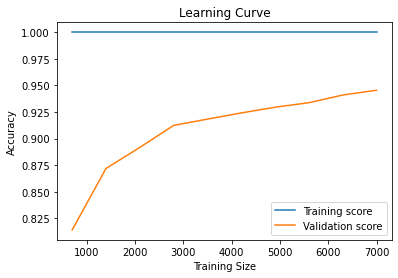

In [77]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

train_sizes, train_scores, val_scores = learning_curve(stack_model, X_train, Y_train, cv=10,
                                                       train_sizes=np.linspace(0.1, 1.0, 10),
                                                       scoring="accuracy")

train_scores_mean = np.mean(train_scores, axis=1)
validation_scores_mean = np.mean(val_scores, axis=1)

plt.plot(train_sizes, train_scores_mean, label='Training score')
plt.plot(train_sizes, validation_scores_mean, label='Validation score')
plt.title('Learning Curve')
plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.legend(loc='best')
plt.show()


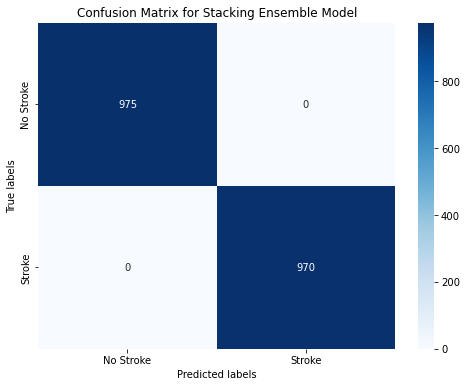

In [78]:
c_matrix = confusion_matrix(Y_test, Y_pred_stack)

plt.figure(figsize=(8, 6))
sns.heatmap(c_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['No Stroke', 'Stroke'], yticklabels=['No Stroke', 'Stroke'])
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for Stacking Ensemble Model')
plt.show()

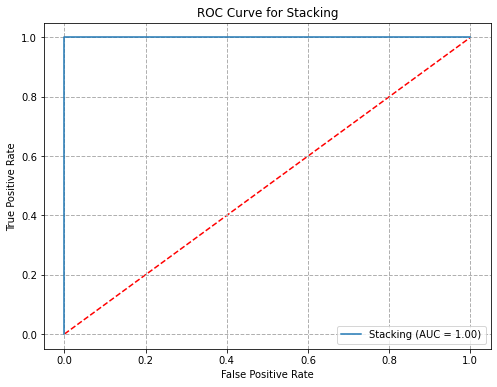

In [79]:
# Calculate the ROC curve and AUC
fpr, tpr, thresholds = roc_curve(Y_test, Y_pred_stack)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
# The 'zorder' parameter places the grid below the ROC curve
plt.plot(fpr, tpr, label=f'Stacking (AUC = {roc_auc:.2f})', zorder=2)
plt.plot([0, 1], [0, 1], 'r--', zorder=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Stacking')
plt.legend(loc="lower right")

# Enable grid with 'zorder' set to 0 to place it behind the ROC curve
plt.grid(True, which='both', linestyle='--', linewidth=1, zorder=0.5)
plt.show()


In [80]:
# Initialize the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_smote),
    feature_names=X_smote.columns,
    class_names=['No Stroke', 'Stroke'],
    mode='classification'
)

# Choose an instance to explain
instance_to_explain = X_test.iloc[0].astype(float)

# Explain the prediction made by the stack model
explanation = explainer.explain_instance(
    data_row=instance_to_explain,
    predict_fn=stack_model.predict_proba
)

print("Stacking Model Explanation")
# Show the explanation
explanation.show_in_notebook(show_table=True)


Stacking Model Explanation


In [81]:

# To display the evaluation metrics across all the model
lr_metrics = {
    'accuracy': accuracy_score(Y_test, Y_pred_logistic),
    'precision': precision_score(Y_test, Y_pred_logistic),
    'recall': recall_score(Y_test, Y_pred_logistic),
    'f1_score': f1_score(Y_test, Y_pred_logistic),

}
dt_metrics = {
    'accuracy': accuracy_score(Y_test, Y_pred_decision_tree),
    'precision': precision_score(Y_test, Y_pred_decision_tree),
    'recall': recall_score(Y_test, Y_pred_decision_tree),
    'f1_score': f1_score(Y_test, Y_pred_decision_tree),
    
}
knn_metrics = {
    'accuracy': accuracy_score(Y_test, Y_pred_knn),
    'precision': precision_score(Y_test, Y_pred_knn),
    'recall': recall_score(Y_test, Y_pred_knn),
    'f1_score': f1_score(Y_test, Y_pred_knn),

}

gb_metrics = {
    'accuracy': accuracy_score(Y_test, Y_pred_Gradient_boosting),
    'precision': precision_score(Y_test, Y_pred_Gradient_boosting),
    'recall': recall_score(Y_test, Y_pred_Gradient_boosting),
    'f1_score': f1_score(Y_test, Y_pred_Gradient_boosting),
}

rf_metrics = {
    'accuracy': accuracy_score(Y_test, Y_pred),
    'precision': precision_score(Y_test, Y_pred),
    'recall': recall_score(Y_test, Y_pred),
    'f1_score': f1_score(Y_test, Y_pred),
}

stack_metrics = {
    'accuracy': accuracy_score(Y_test, Y_pred_stack),
    'precision': precision_score(Y_test, Y_pred_stack),
    'recall': recall_score(Y_test, Y_pred_stack),
    'f1_score': f1_score(Y_test, Y_pred_stack),
}

# Create a dictionary with model names as keys and dictionaries of metrics as values
model_performance_summary = {
    'Logistic Regression': lr_metrics,
    'Decision Tree': dt_metrics,
    'KNN': knn_metrics,
    'Random Forest': rf_metrics,
    'Gradient Boosting': gb_metrics,
    'Stacking Ensemble': stack_metrics
}

# Create a DataFrame from the dictionary
comparison_df = pd.DataFrame(model_performance_summary).T

# Convert numerical values to two decimal places
comparison_df = comparison_df.apply(lambda x: x.map('{:.2f}'.format) if x.dtype == float else x)

# Style the DataFrame for a nicer display
styled_df = comparison_df.style.set_table_styles(
    [{'selector': 'th',
      'props': [('font-size', '14pt'), ('text-align', 'center'),
                ('font-weight', 'bold'), ('color', 'black'),
                ('background-color', 'lightgrey')]}]
).background_gradient(cmap='coolwarm')

# Display the styled DataFrame
styled_df

,accuracy,precision,recall,f1_score
Logistic Regression,0.78,0.76,0.83,0.79
Decision Tree,0.92,0.91,0.92,0.92
KNN,0.90,0.84,0.98,0.91
Random Forest,0.94,0.91,0.97,0.94
Gradient Boosting,0.98,0.99,0.98,0.98
Stacking Ensemble,1.00,1.00,1.00,1.00


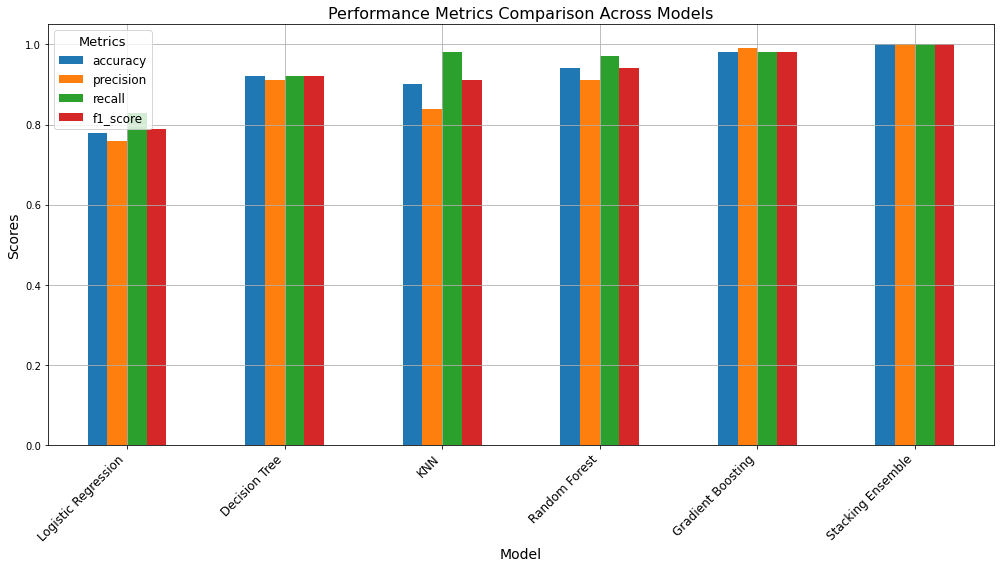

In [93]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you already have the comparison_df DataFrame from the previous code
# Note: You should run this block after you have filled the comparison_df with actual data from your model evaluations.

# Convert the DataFrame values back to float for plotting
comparison_df = comparison_df.applymap(float)

# Plotting
fig, ax = plt.subplots(figsize=(14, 8))
comparison_df.plot(kind='bar', ax=ax)

# Setting titles and labels
ax.set_title('Performance Metrics Comparison Across Models', fontsize=16)
ax.set_xlabel('Model', fontsize=14)
ax.set_ylabel('Scores', fontsize=14)
ax.set_xticklabels(comparison_df.index, rotation=45, ha='right', fontsize=12)

# Add legend
ax.legend(title='Metrics', title_fontsize='13', fontsize='12')

# Show grid
ax.grid(True)

# Display the plot
plt.tight_layout()
plt.show()


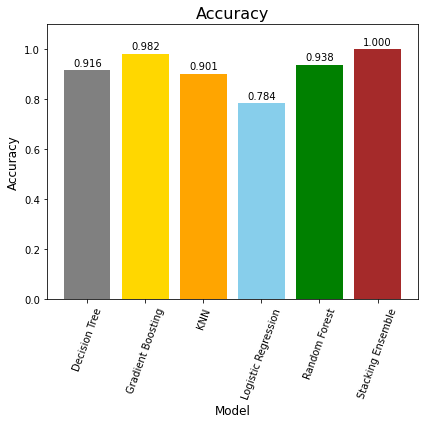

In [84]:
import matplotlib.pyplot as plt
import pandas as pd

# Extracting accuracy for each model into a DataFrame for plotting
accuracy_data = {model: metrics['accuracy'] for model, metrics in model_performance_summary.items()}
accuracy_df = pd.DataFrame(list(accuracy_data.items()), columns=['Model', 'Accuracy'])

# Sorting the data by model names for consistent color mapping
accuracy_df.sort_values('Model', inplace=True)

# Define a list of colors for the bars, ensuring there are enough colors for all models
colors = ['grey', 'gold','orange','skyblue', 'green', 'brown']

# Creating the bar plot with different colors for each bar
plt.figure(figsize=(6, 6))
bars = plt.bar(accuracy_df['Model'], accuracy_df['Accuracy'], color=colors)

# Adding the accuracy values above the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.3f}', ha='center', va='bottom')

plt.xlabel('Model', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Accuracy', fontsize=16)
plt.xticks(rotation=70)
plt.ylim(0, 1.1)  
plt.tight_layout()

# Display the plot
plt.show()

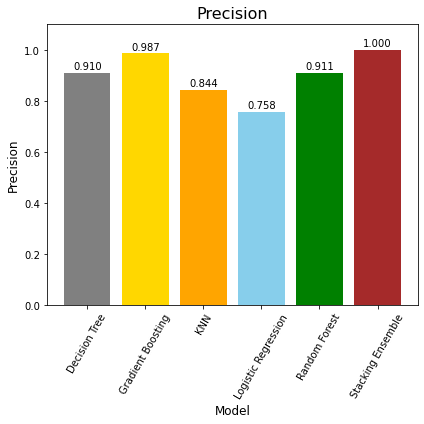

In [85]:
# Extracting precision for each model into a DataFrame for plotting
precision_data = {model: metrics['precision'] for model, metrics in model_performance_summary.items()}
precision_df = pd.DataFrame(list(precision_data.items()), columns=['Model', 'Precision'])

# Sorting the data by model names for consistent color mapping
precision_df.sort_values('Model', inplace=True)

# Define a list of colors for the bars, ensuring there are enough colors for all models
colors = ['grey', 'gold','orange','skyblue', 'green', 'brown']

# Creating the bar plot with different colors for each bar
plt.figure(figsize=(6, 6))
bars = plt.bar(precision_df['Model'], precision_df['Precision'], color=colors)

# Adding the precision values above the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.005, f'{yval:.3f}', ha='center', va='bottom')

plt.xlabel('Model', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision', fontsize=16)
plt.xticks(rotation=60)
plt.ylim(0, 1.1)  
plt.tight_layout()

# Display the plot
plt.show()


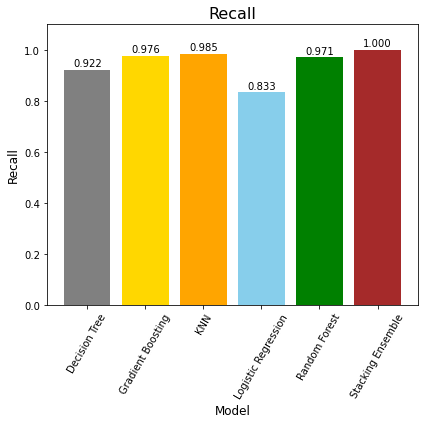

In [86]:
# Extracting recall for each model into a DataFrame for plotting
recall_data = {model: metrics['recall'] for model, metrics in model_performance_summary.items()}
recall_df = pd.DataFrame(list(recall_data.items()), columns=['Model', 'Recall'])

# Sorting the data by model names for consistent color mapping
recall_df.sort_values('Model', inplace=True)

colors = ['grey', 'gold','orange','skyblue', 'green', 'brown']

# Creating the bar plot with different colors for each bar
plt.figure(figsize=(6, 6))
bars = plt.bar(recall_df['Model'], recall_df['Recall'], color=colors)

# Adding the recall values above the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.005, f'{yval:.3f}', ha='center', va='bottom')

plt.xlabel('Model', fontsize=12)
plt.ylabel('Recall', fontsize=12)
plt.title('Recall', fontsize=16)
plt.xticks(rotation=60)
plt.ylim(0, 1.1) 
plt.tight_layout()  

# Display the plot
plt.show()


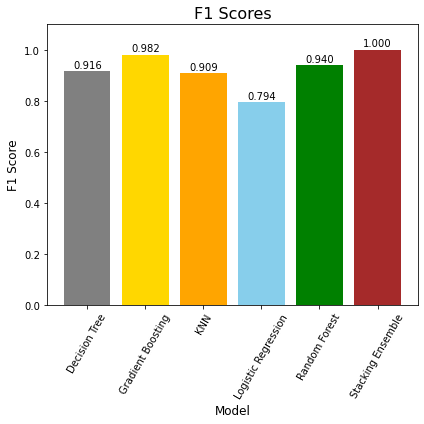

In [87]:
# Extracting F1 scores for each model into a DataFrame for plotting
f1_score_data = {model: metrics['f1_score'] for model, metrics in model_performance_summary.items()}
f1_score_df = pd.DataFrame(list(f1_score_data.items()), columns=['Model', 'F1 Score'])

# Sorting the data by model names for consistent color mapping
f1_score_df.sort_values('Model', inplace=True)

colors = ['grey', 'gold','orange','skyblue', 'green', 'brown']

plt.figure(figsize=(6, 6))
bars = plt.bar(f1_score_df['Model'], f1_score_df['F1 Score'], color=colors)

# Adding the F1 score values above the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.005, f'{yval:.3f}', ha='center', va='bottom')

plt.xlabel('Model', fontsize=12)
plt.ylabel('F1 Score', fontsize=12)
plt.title('F1 Scores', fontsize=16)
plt.xticks(rotation=60)
plt.ylim(0, 1.1)  
plt.tight_layout() 

# Display the plot
plt.show()


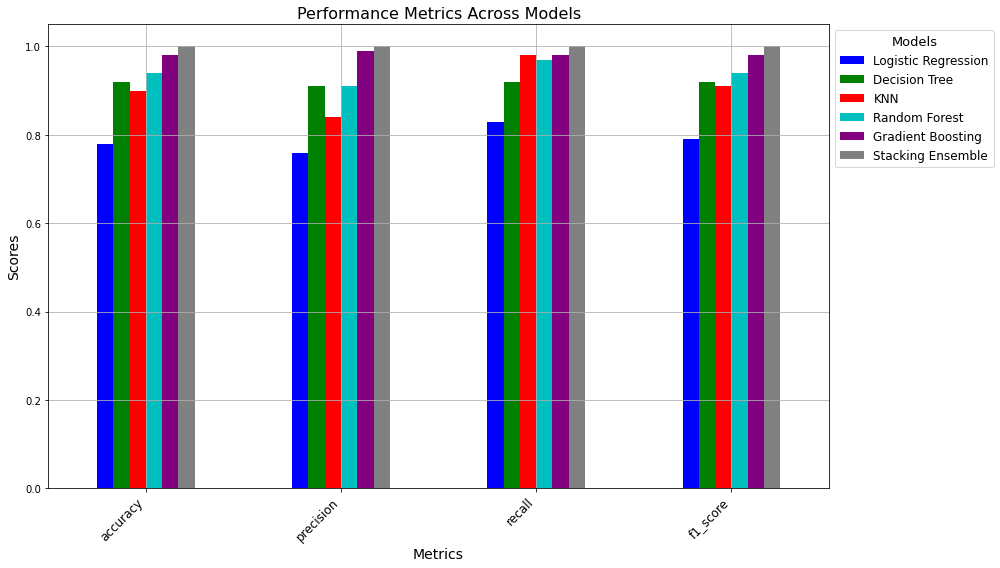

In [102]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you already have the comparison_df DataFrame from the previous code
# Note: You should run this block after you have filled the comparison_df with actual data from your model evaluations.

# Convert the DataFrame values back to float for plotting
comparison_df = comparison_df.applymap(float)

# Transpose the DataFrame to switch the grouping by metrics
comparison_df = comparison_df.T

# Define distinct colors for each model, assuming there are N models
colors = ['b', 'g', 'r', 'c', 'purple', 'grey', 'skyblue']  # Extend this list if there are more than 7 models

# Plotting
fig, ax = plt.subplots(figsize=(14, 8))
comparison_df.plot(kind='bar', ax=ax, color=colors)

# Setting titles and labels
ax.set_title('Performance Metrics Across Models', fontsize=16)
ax.set_xlabel('Metrics', fontsize=14)
ax.set_ylabel('Scores', fontsize=14)
ax.set_xticklabels(comparison_df.index, rotation=45, ha='right', fontsize=12)

# Adjust legend position to outside the plot area, to the right
ax.legend(title='Models', title_fontsize='13', fontsize='12', loc='upper left', bbox_to_anchor=(1, 1))

# Show grid
ax.grid(True)

# Display the plot
plt.tight_layout()
plt.show()
